## Import Libraries

In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as ex
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
import plotly.offline as pyo
import seaborn as sns
pyo.init_notebook_mode()
sns.set_style('darkgrid')
import plotly.express as px


import sklearn
from sklearn.preprocessing import OrdinalEncoder
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import xgboost as xgb
from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix, roc_curve
from sklearn.metrics import ConfusionMatrixDisplay
import scikitplot as skplt
from scikitplot.estimators import plot_feature_importances
from scikitplot.metrics import plot_confusion_matrix, plot_roc


import warnings
warnings.filterwarnings("ignore")


In [6]:
pip install scikit-plot


  Using cached scikit_plot-0.3.7-py3-none-any.whl.metadata (7.1 kB)
Using cached scikit_plot-0.3.7-py3-none-any.whl (33 kB)


In [1]:
!pip install scipy==1.9.3


In [2]:
pip install category_encoders

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.0/82.0 kB 4.5 MB/s eta 0:00:00


## Load the Data

In [71]:
data = pd.read_csv('BankChurners.csv')
df = pd.DataFrame(data)

In [37]:
df

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0.000093,0.999910
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0.000057,0.999940
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0.000021,0.999980
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0.000134,0.999870
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0.000022,0.999980
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,...,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462,0.000191,0.999810
10123,710638233,Attrited Customer,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,...,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511,0.995270,0.004729
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,...,5409.0,0,5409.0,0.819,10291,60,0.818,0.000,0.997880,0.002118
10125,717406983,Attrited Customer,30,M,2,Graduate,Unknown,$40K - $60K,Blue,36,...,5281.0,0,5281.0,0.535,8395,62,0.722,0.000,0.996710,0.003294


In [38]:
df.shape

(10127, 23)

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 23 columns):
 #   Column                                                                                                                              Non-Null Count  Dtype  
---  ------                                                                                                                              --------------  -----  
 0   CLIENTNUM                                                                                                                           10127 non-null  int64  
 1   Attrition_Flag                                                                                                                      10127 non-null  object 
 2   Customer_Age                                                                                                                        10127 non-null  int64  
 3   Gender                                                                           

In [72]:
df = df.iloc[:,:-2]

In [73]:
df.drop(columns=['CLIENTNUM'], inplace=True)

In [74]:
df.shape
df.isna().sum()

,0
Attrition_Flag,0
Customer_Age,0
Gender,0
Dependent_count,0
Education_Level,0
Marital_Status,0
Income_Category,0
Card_Category,0
Months_on_book,0
Total_Relationship_Count,0


## Plot and Data Analyses

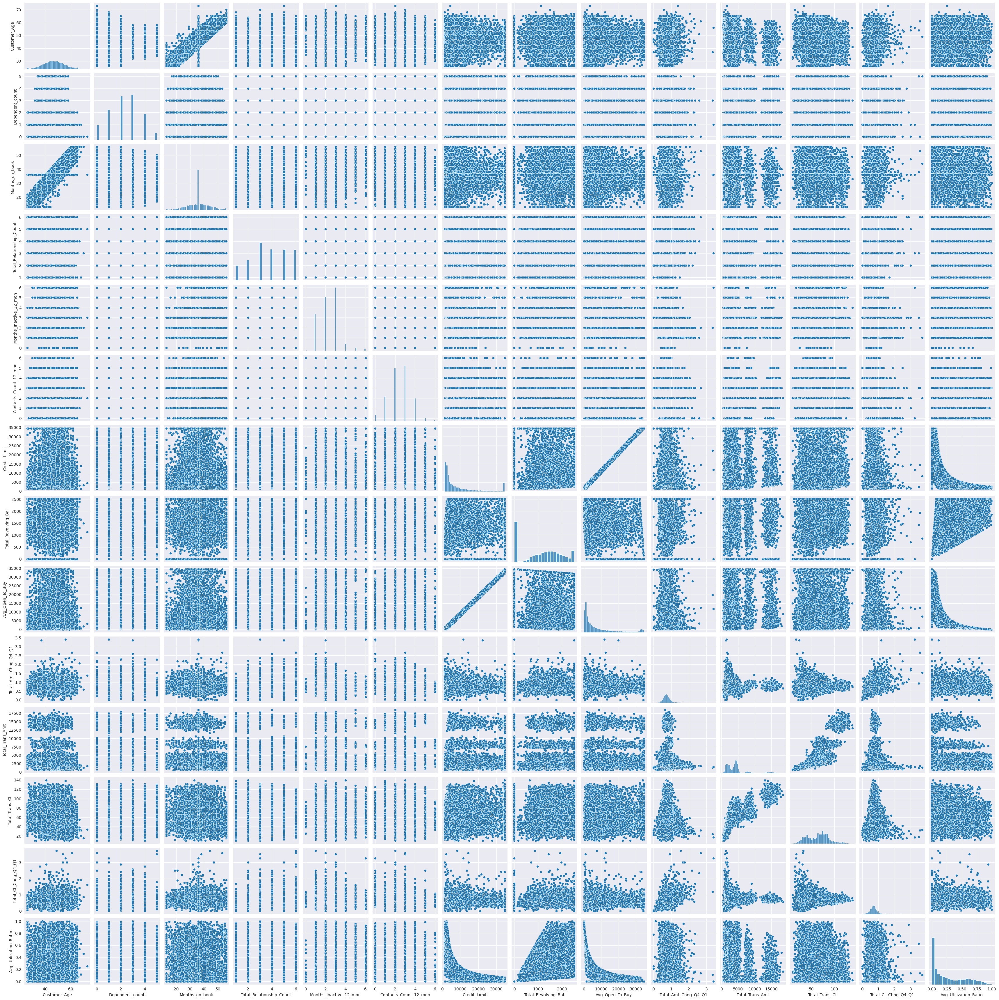

In [ ]:
sns.pairplot(data=df)

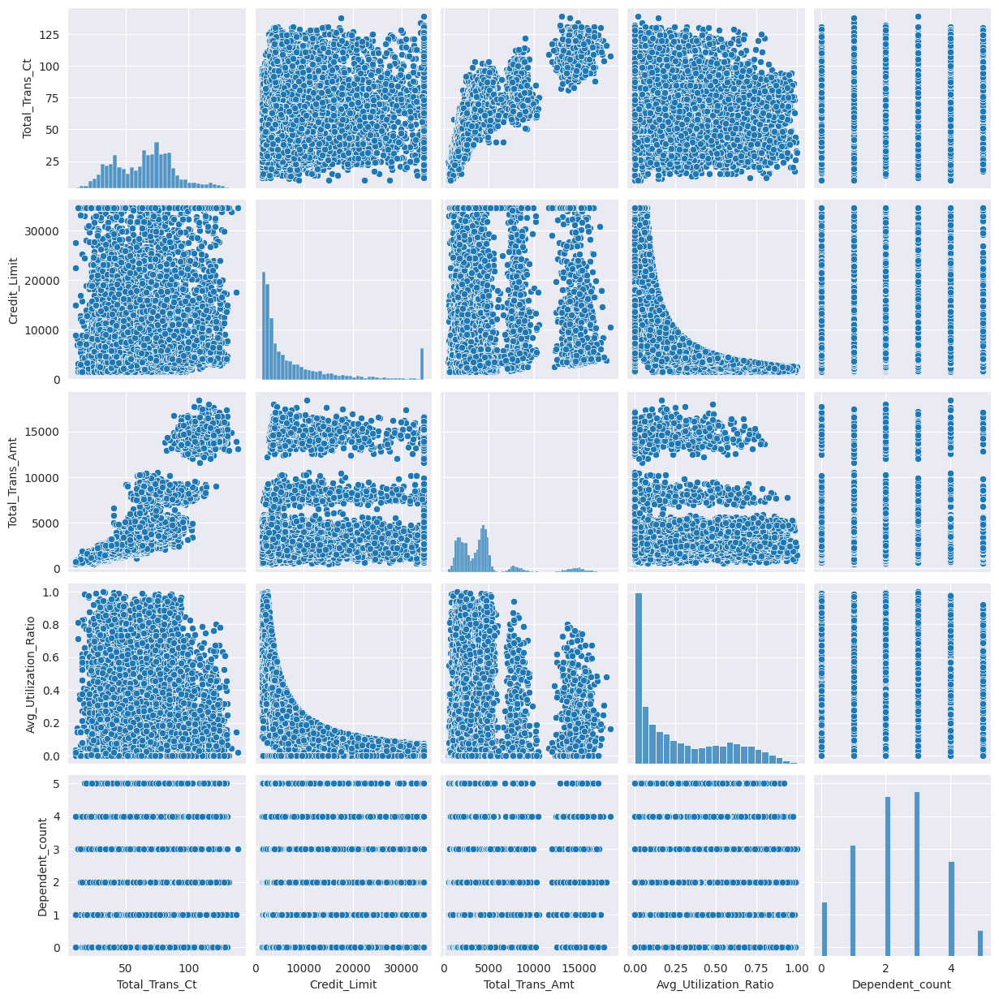

In [ ]:
features_1 = ['Total_Trans_Ct', 'Credit_Limit', 'Total_Trans_Amt', 'Avg_Utilization_Ratio']
features_2 = ['Attrition_Flag', 'Gender', 'Education_Level', 'Dependent_count']

new_df = df[features_1 + features_2]

sns.pairplot(data=new_df)

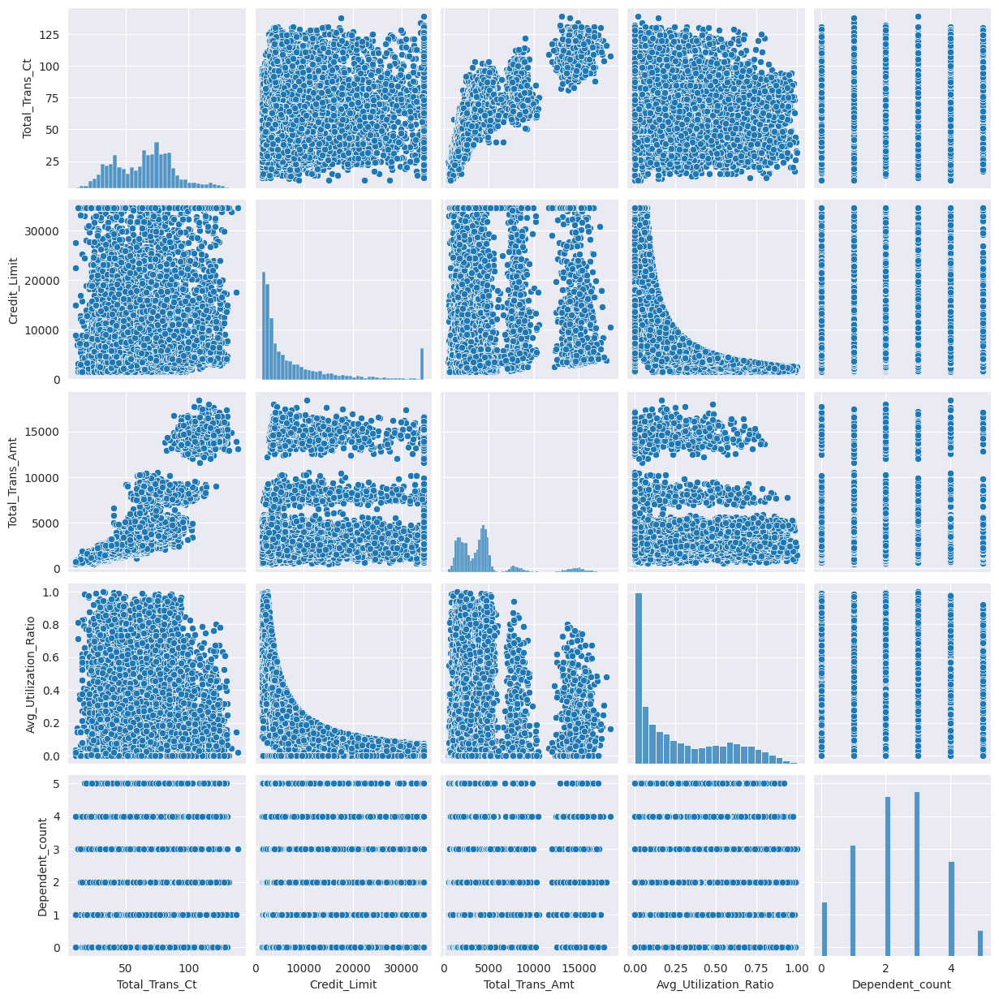

In [ ]:
features = ['Total_Trans_Ct', 'Credit_Limit', 'Total_Trans_Amt', 'Avg_Utilization_Ratio', 'Attrition_Flag', 'Gender', 'Education_Level', 'Dependent_count']
new_df = df[features]
sns.pairplot(data=new_df)

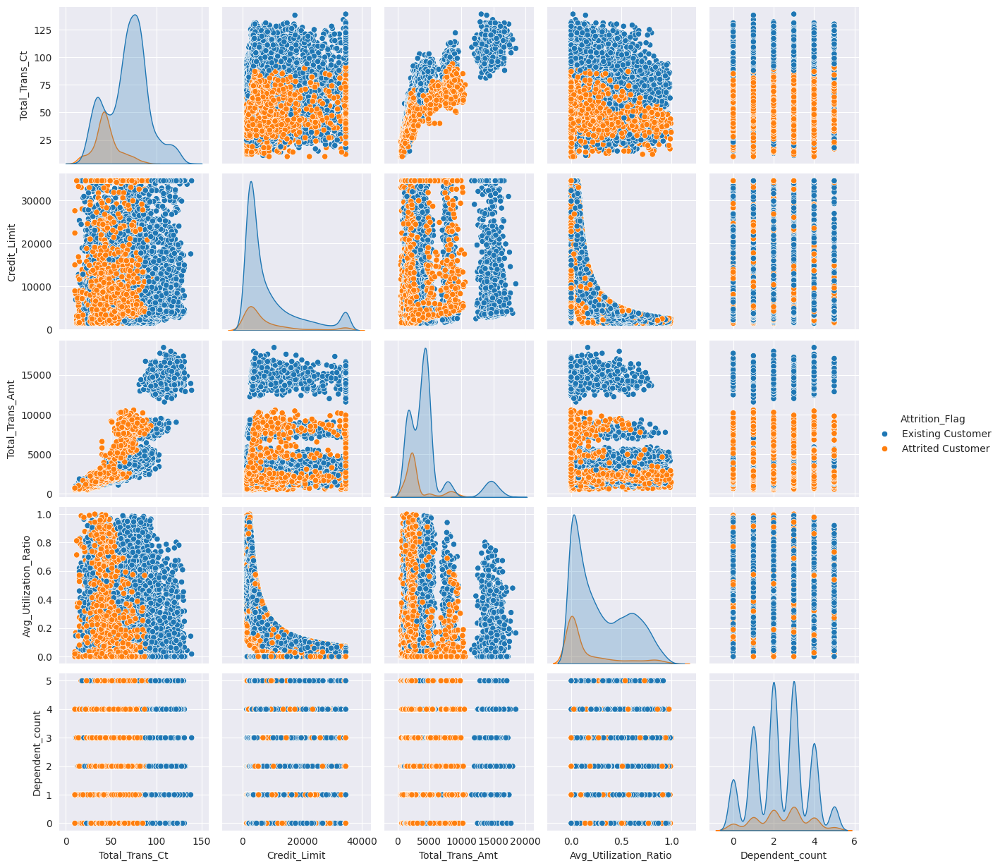

In [ ]:
sns.pairplot(data=new_df, hue='Attrition_Flag')


## Attrition Flag

In [16]:
df['Attrition_Flag'].value_counts()

,count
Attrition_Flag,
Existing Customer,8500
Attrited Customer,1627


In [17]:
fig = px.pie(df, names='Attrition_Flag', title='Attrition Flag Distribution')
fig.show(renderer="colab")

## Encoding the data

In [75]:
class CustomEncoder:
    def __init__(self):
        self.ordinal_encoder = None
        self.binary_features = []
        self.ordinal_features = []
        self.feature_mapping = {}  # Attribute to store the mapping of encoded columns

    def fit(self, df):
        """
        Identify categorical columns, classify them, and prepare encoders
        """
        self.binary_features = []
        self.ordinal_features = []

        for column in df:
            if df[column].dtype == 'object':
                unique_values = df[column].unique()
                # Classify as binary or multi-class based on unique value count
                if len(unique_values) == 2:
                    self.binary_features.append(column)
                elif len(unique_values) > 2:
                    self.ordinal_features.append(column)

        # Prepare ordinal encoder for multi-class features and store mappings
        if self.ordinal_features:
            self.ordinal_encoder = OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1)
            self.ordinal_encoder.fit(df[self.ordinal_features])
            for i, col in enumerate(self.ordinal_features):
                self.feature_mapping[col] = {category: idx for idx, category in enumerate(self.ordinal_encoder.categories_[i])}

    def transform(self, df):
        """
        Apply ordinal encoding to the data and binary encoding as 0 and 1
        Handle unknown values by using a new category (Unknown)
        """
        df_transformed = df.copy()

        # Replace NaN or missing values with 'Unknown' for both binary and multi-class features
        for col in self.binary_features + self.ordinal_features:
            df_transformed[col] = df_transformed[col].fillna('Unknown')

        # Apply binary encoding for binary features (0 and 1)
        for col in self.binary_features:
            df_transformed[col] = df_transformed[col].replace({df_transformed[col].unique()[0]: 0, df_transformed[col].unique()[1]: 1})
            # In case the "Unknown" value exists, map it to a specific value (e.g., -1)
            df_transformed[col] = df_transformed[col].replace('Unknown', -1)  # Assuming -1 for unknown

        # Apply ordinal encoding for multi-class features, treating 'Unknown' as a separate category
        if self.ordinal_features:
            df_transformed[self.ordinal_features] = self.ordinal_encoder.transform(df_transformed[self.ordinal_features])

        return df_transformed

    def fit_transform(self, df):
        """
        Combine fit and transform methods
        """
        self.fit(df)
        return self.transform(df)

    def get_feature_mapping(self):
        """
        Return the feature mapping
        """
        return self.feature_mapping


In [76]:
encoder = CustomEncoder()
df_encoded = encoder.fit_transform(df)

# Retrieve the feature mapping
feature_mapping = encoder.get_feature_mapping()
print("Feature Mapping:")
print(feature_mapping)

Feature Mapping:
{'Education_Level': {'College': 0, 'Doctorate': 1, 'Graduate': 2, 'High School': 3, 'Post-Graduate': 4, 'Uneducated': 5, 'Unknown': 6}, 'Marital_Status': {'Divorced': 0, 'Married': 1, 'Single': 2, 'Unknown': 3}, 'Income_Category': {'$120K +': 0, '$40K - $60K': 1, '$60K - $80K': 2, '$80K - $120K': 3, 'Less than $40K': 4, 'Unknown': 5}, 'Card_Category': {'Blue': 0, 'Gold': 1, 'Platinum': 2, 'Silver': 3}}


In [77]:
df_encoded.isnull().sum()

,0
Attrition_Flag,0
Customer_Age,0
Gender,0
Dependent_count,0
Education_Level,0
Marital_Status,0
Income_Category,0
Card_Category,0
Months_on_book,0
Total_Relationship_Count,0


In [78]:
df_encoded.shape

(10127, 20)

In [22]:
df_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 18 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  int64  
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  int64  
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           10127 non-null  float64
 5   Marital_Status            10127 non-null  float64
 6   Income_Category           10127 non-null  float64
 7   Card_Category             10127 non-null  float64
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14  Avg_Op

In [23]:
df_encoded.describe()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct
count,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000
mean,0.160660,46.325960,0.529081,2.346203,3.096574,1.463415,2.863928,0.179816,35.928409,3.812580,2.341167,2.455317,8631.953698,1162.814061,7469.139637,0.759941,4404.086304,64.858695
std,0.367235,8.016814,0.499178,1.298908,1.834812,0.737808,1.504700,0.693039,7.986416,1.554408,1.010622,1.106225,9088.776650,814.987335,9090.685324,0.219207,3397.129254,23.472570
min,0.000000,26.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000
25%,0.000000,41.000000,0.000000,1.000000,2.000000,1.000000,2.000000,0.000000,31.000000,3.000000,2.000000,2.000000,2555.000000,359.000000,1324.500000,0.631000,2155.500000,45.000000
50%,0.000000,46.000000,1.000000,2.000000,3.000000,1.000000,3.000000,0.000000,36.000000,4.000000,2.000000,2.000000,4549.000000,1276.000000,3474.000000,0.736000,3899.000000,67.000000
75%,0.000000,52.000000,1.000000,3.000000,5.000000,2.000000,4.000000,0.000000,40.000000,5.000000,3.000000,3.000000,11067.500000,1784.000000,9859.000000,0.859000,4741.000000,81.000000
max,1.000000,73.000000,1.000000,5.000000,6.000000,3.000000,5.000000,3.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,139.000000


## Correlation

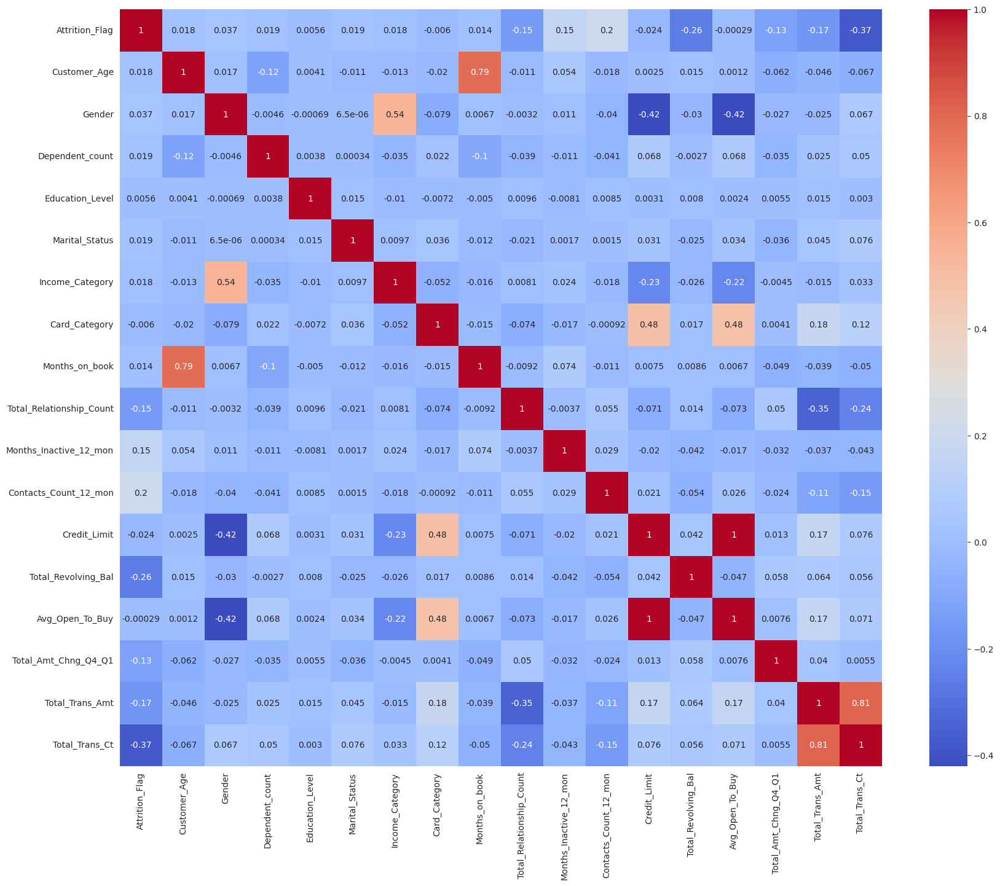

In [24]:
plt.figure(figsize=(20, 16))
sns.heatmap(df_encoded.corr(), annot=True, cmap='coolwarm')
plt.show()

## Split the data

In [79]:
x = df_encoded.drop('Attrition_Flag', axis=1)
y = df_encoded['Attrition_Flag']


In [80]:
req_c = ['Credit_Limit', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1',
         'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']

scaler = StandardScaler()
x[req_c] = scaler.fit_transform(x[req_c])
x[req_c] = scaler.transform(x[req_c])

In [34]:
x

,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct
0,45,0,3,3.0,1.0,2.0,0.0,39,5,1,3,12691.0,777,11914.0,1.335,1144,42
1,49,1,5,2.0,2.0,4.0,0.0,44,6,1,2,8256.0,864,7392.0,1.541,1291,33
2,51,0,3,2.0,1.0,3.0,0.0,36,4,1,0,3418.0,0,3418.0,2.594,1887,20
3,40,1,4,3.0,3.0,4.0,0.0,34,3,4,1,3313.0,2517,796.0,1.405,1171,20
4,40,0,3,5.0,1.0,2.0,0.0,21,5,1,0,4716.0,0,4716.0,2.175,816,28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,50,0,2,2.0,2.0,1.0,0.0,40,3,2,3,4003.0,1851,2152.0,0.703,15476,117
10123,41,0,2,6.0,0.0,1.0,0.0,25,4,2,3,4277.0,2186,2091.0,0.804,8764,69
10124,44,1,1,3.0,1.0,4.0,0.0,36,5,3,4,5409.0,0,5409.0,0.819,10291,60
10125,30,0,2,2.0,3.0,1.0,0.0,36,4,3,3,5281.0,0,5281.0,0.535,8395,62


## Using PCA to reduce dimensions

In [81]:
correlation_matrix = df_encoded.corr()
threshold = 0.6

correlated_features = []
for i in range(len(correlation_matrix.columns)):
    for j in range(i + 1, len(correlation_matrix.columns)):
        feature1 = correlation_matrix.columns[i]
        feature2 = correlation_matrix.columns[j]
        correlation = correlation_matrix.iloc[i, j]
        if abs(correlation) > threshold:
            correlated_features.append((feature1, feature2, correlation))


for feature1, feature2, correlation in correlated_features:
    print(f"Features: {feature1}, {feature2}, Correlation: {correlation}")

Features: Customer_Age, Months_on_book, Correlation: 0.7889123589930508
Features: Credit_Limit, Avg_Open_To_Buy, Correlation: 0.995980543932001
Features: Total_Revolving_Bal, Avg_Utilization_Ratio, Correlation: 0.6240219910059064
Features: Total_Trans_Amt, Total_Trans_Ct, Correlation: 0.8071920346514367


In [82]:
group_1 = ['Customer_Age', 'Months_on_book']
group_2 = ['Credit_Limit', 'Avg_Open_To_Buy']
group_3 = ['Total_Trans_Amt', 'Total_Trans_Ct']
group_4 = ['Total_Revolving_Bal', 'Avg_Utilization_Ratio']

pca_1 = PCA(n_components=1)
X_group_1_pca = pca_1.fit_transform(x[group_1])

pca_2 = PCA(n_components=1)
X_group_2_pca = pca_2.fit_transform(x[group_2])

pca_3 = PCA(n_components=1)
X_group_3_pca = pca_3.fit_transform(x[group_3])

pca_4 = PCA(n_components=1)
X_group_4_pca = pca_4.fit_transform(x[group_4])

print("Group 1 Variance Explained:", pca_1.explained_variance_ratio_)
print("Group 2 Variance Explained:", pca_2.explained_variance_ratio_)
print("Group 3 Variance Explained:", pca_3.explained_variance_ratio_)
print("Group 4 Variance Explained:", pca_4.explained_variance_ratio_)


X_reduced = pd.DataFrame({
    'Group_1_PCA': X_group_1_pca.flatten(),
    'Group_2_PCA': X_group_2_pca.flatten(),
    'Group_3_PCA': X_group_3_pca.flatten(),
    'Group_4_PCA': X_group_4_pca.flatten()
})

Group 1 Variance Explained: [0.89445791]
Group 2 Variance Explained: [0.99799029]
Group 3 Variance Explained: [0.99998337]
Group 4 Variance Explained: [0.99999993]


In [49]:
X_reduced

,Group_1_PCA,Group_2_PCA,Group_3_PCA,Group_4_PCA
0,1.226857,0.000073,-0.041494,-2.814453
1,7.589097,-0.000004,-0.057830,-2.235492
2,3.363493,-0.000079,-0.081427,-3.617103
3,-5.844191,-0.000103,-0.081427,6.383124
4,-15.014420,-0.000057,-0.066906,-3.617103
...,...,...,...,...
10122,5.476295,-0.000085,0.094650,2.461983
10123,-11.484003,-0.000083,0.007519,3.106734
10124,-1.598157,-0.000045,-0.008816,-3.617103
10125,-11.521458,-0.000047,-0.005187,-3.617103


In [83]:
x_new = x.copy()
x_new = pd.concat([x_new, X_reduced], axis = 1)
x_new = x_new.drop(columns=group_1 + group_2 + group_3 + group_4)

In [84]:
x_new.shape

(10127, 15)

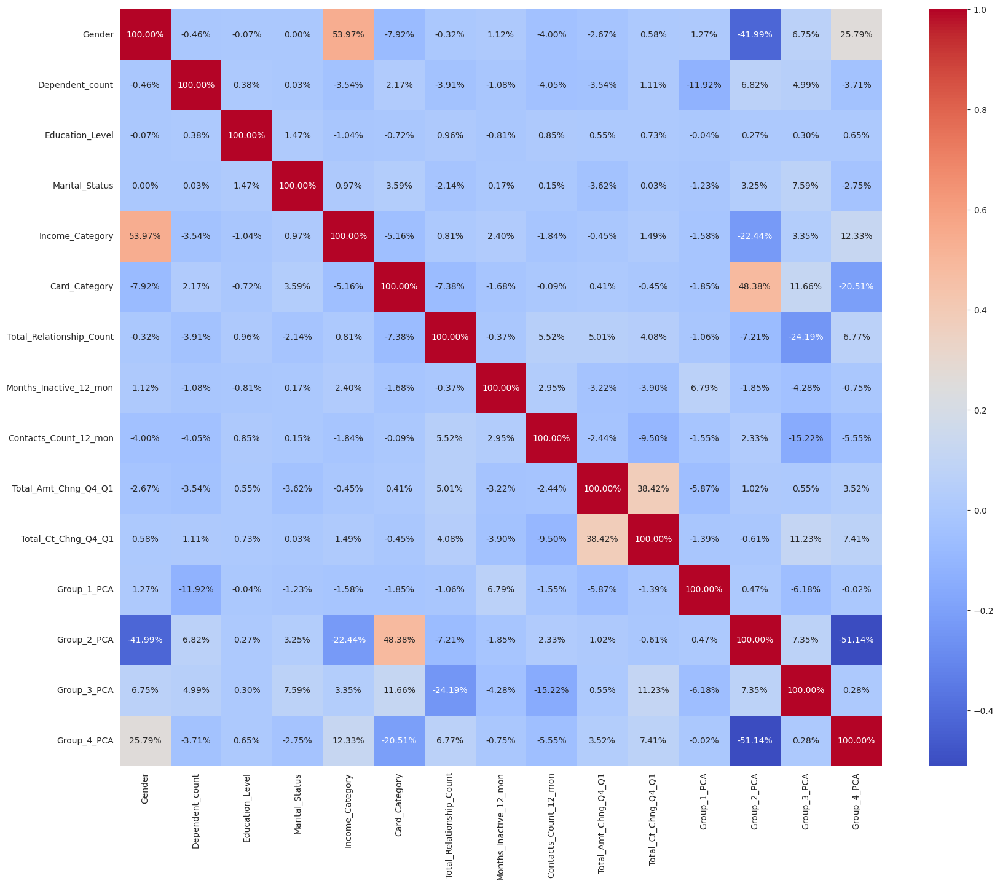

In [52]:
plt.figure(figsize=(20, 16))
sns.heatmap(x_new.corr(), annot=True, fmt=".2%", cmap='coolwarm')
plt.show()

In [85]:
x_train, x_rem, y_train, y_rem = train_test_split(x_new, y, train_size=0.7, random_state=73, stratify=y)
x_valid, x_test, y_valid, y_test = train_test_split(x_rem, y_rem, test_size=0.5, random_state=73, stratify=y_rem)

print("Training set shape:", x_train.shape, y_train.shape)
print("Validation set shape:", x_valid.shape, y_valid.shape)
print("Test set shape:", x_test.shape, y_test.shape)

Training set shape: (7088, 15) (7088,)
Validation set shape: (1519, 15) (1519,)
Test set shape: (1520, 15) (1520,)


## Model

In [54]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV

# Define parameter grid
param_grid = {
    "n_estimators": [50, 100, 150, 300],
    "max_depth": [3, 6, 9],
    "learning_rate": [0.01, 0.1, 0.2],
}


xgb_clf = xgb.XGBClassifier()

# Perform grid search
grid_search = GridSearchCV(estimator=xgb_clf, param_grid=param_grid, cv=5, scoring="accuracy", verbose=1)
grid_search.fit(x_train, y_train)

# Best parameters
print("Best Parameters:", grid_search.best_params_)

# Evaluate the tuned model
best_model = grid_search.best_estimator_
y_pred = best_model.predict(x_test)
print(f"Tuned Model Accuracy: {accuracy_score(y_test, y_pred):.2f}")

Fitting 5 folds for each of 36 candidates, totalling 180 fits
Best Parameters: {'learning_rate': 0.1, 'max_depth': 6, 'n_estimators': 300}
Tuned Model Accuracy: 0.94


In [55]:
print(classification_report(y_train, best_model.predict(x_train)))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5949
           1       1.00      1.00      1.00      1139

    accuracy                           1.00      7088
   macro avg       1.00      1.00      1.00      7088
weighted avg       1.00      1.00      1.00      7088



In [56]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.95      0.97      0.96      1276
           1       0.85      0.75      0.79       244

    accuracy                           0.94      1520
   macro avg       0.90      0.86      0.88      1520
weighted avg       0.94      0.94      0.94      1520



In [57]:
y_valid_pred = best_model.predict(x_valid)

print(f"Tuned Model Accuracy: {accuracy_score(y_valid, y_valid_pred):.2f}")

Tuned Model Accuracy: 0.93


In [58]:
print(classification_report(y_valid, y_valid_pred))

              precision    recall  f1-score   support

           0       0.95      0.97      0.96      1275
           1       0.84      0.70      0.77       244

    accuracy                           0.93      1519
   macro avg       0.89      0.84      0.86      1519
weighted avg       0.93      0.93      0.93      1519



In [ ]:
y_valid_pred = best_model.predict(x_valid)
print(classification_report(y_valid, y_valid_pred))

              precision    recall  f1-score   support

           0       0.95      0.97      0.96      1275
           1       0.84      0.70      0.77       244

    accuracy                           0.93      1519
   macro avg       0.89      0.84      0.86      1519
weighted avg       0.93      0.93      0.93      1519



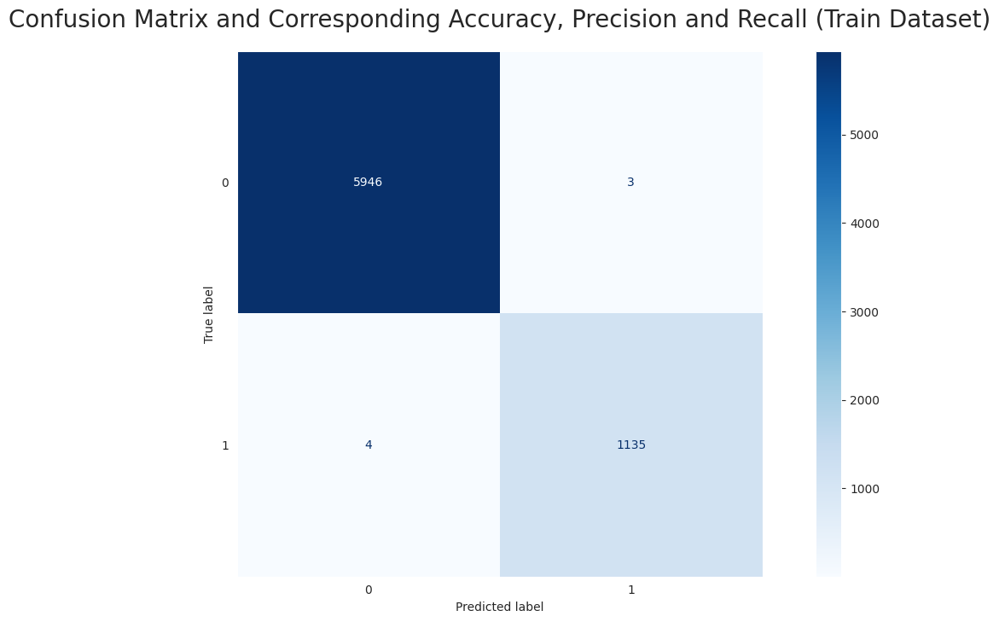

In [61]:
cfm = confusion_matrix(y_true=y_train, y_pred=best_model.predict(x_train))

TP = cfm[0][0]
FN = cfm[0][1]
FP = cfm[1][0]
TN = cfm[1][1]

# Create ConfusionMatrixDisplay object
disp = ConfusionMatrixDisplay(confusion_matrix=cfm, display_labels=best_model.classes_)

fig, ax = plt.subplots(figsize=(16, 8))
plt.title("Confusion Matrix and Corresponding Accuracy, Precision and Recall (Train Dataset)", size=20, pad=20)
# Plot the confusion matrix using the display object
disp.plot(cmap='Blues', ax=ax)
plt.grid(False)
plt.show()

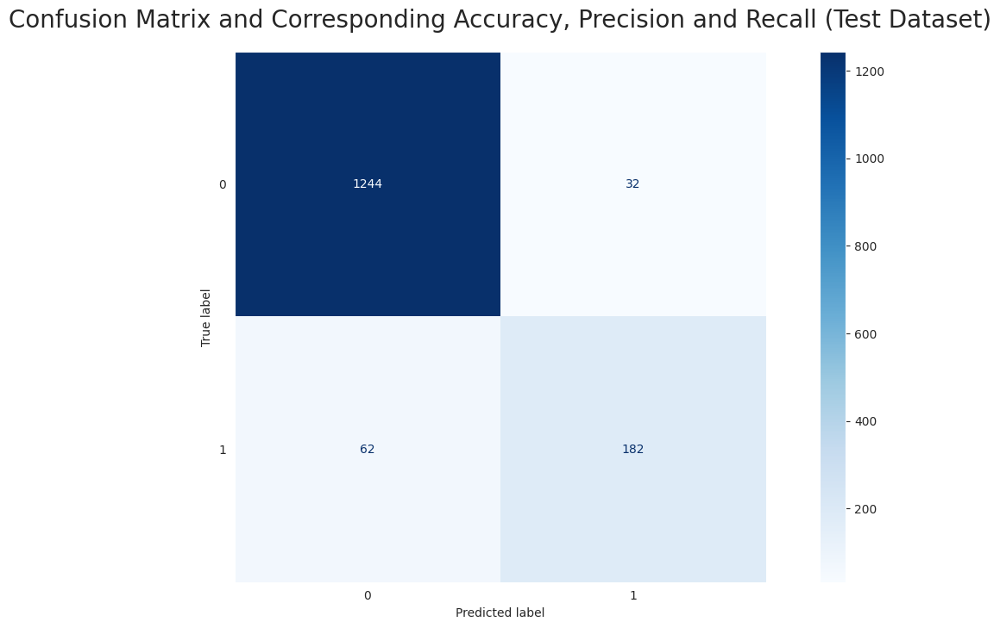

In [62]:
cfm = confusion_matrix(y_true=y_test, y_pred=best_model.predict(x_test))

TP = cfm[0][0]
FN = cfm[0][1]
FP = cfm[1][0]
TN = cfm[1][1]

# Create ConfusionMatrixDisplay object
disp = ConfusionMatrixDisplay(confusion_matrix=cfm, display_labels=best_model.classes_)

fig, ax = plt.subplots(figsize=(16, 8))
plt.title("Confusion Matrix and Corresponding Accuracy, Precision and Recall (Test Dataset)", size=20, pad=20)
# Plot the confusion matrix using the display object
disp.plot(cmap='Blues', ax=ax)
plt.grid(False)
plt.show()

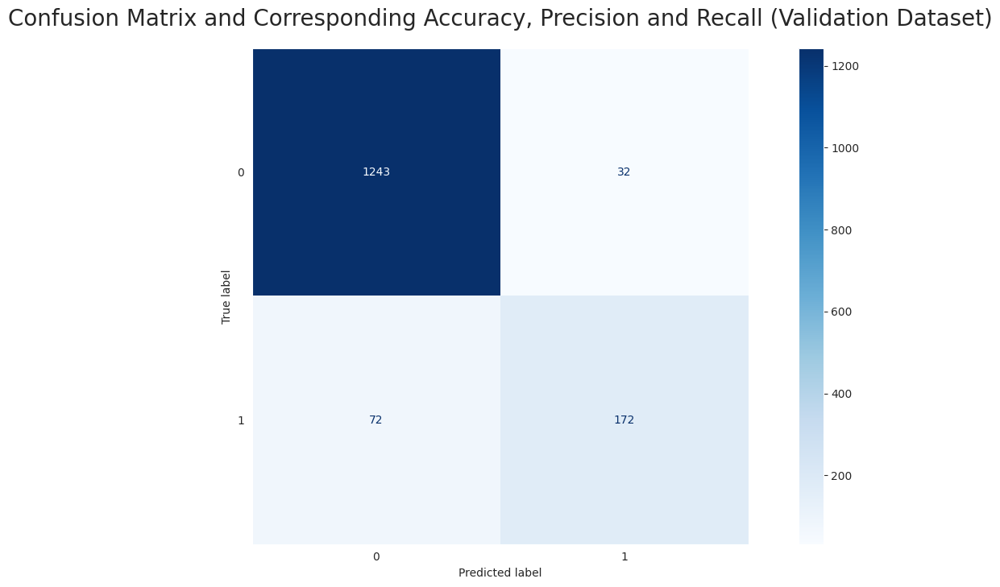

In [63]:
cfm = confusion_matrix(y_true=y_valid, y_pred=best_model.predict(x_valid))

TP = cfm[0][0]
FN = cfm[0][1]
FP = cfm[1][0]
TN = cfm[1][1]

# Create ConfusionMatrixDisplay object
disp = ConfusionMatrixDisplay(confusion_matrix=cfm, display_labels=best_model.classes_)

fig, ax = plt.subplots(figsize=(16, 8))
plt.title("Confusion Matrix and Corresponding Accuracy, Precision and Recall (Validation Dataset)", size=20, pad=20)
# Plot the confusion matrix using the display object
disp.plot(cmap='Blues', ax=ax)
plt.grid(False)
plt.show()

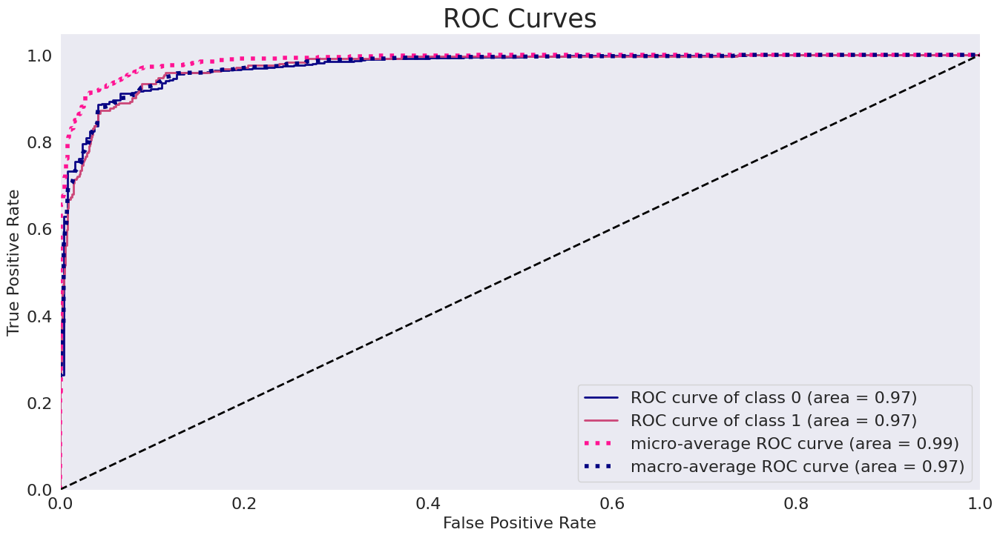

In [64]:
y_true = y_test # ground truth labels
y_probas = best_model.predict_proba(x_test) # predicted probabilities generated by sklearn classifier

skplt.metrics.plot_roc(y_true, y_probas, figsize=(16,8), title_fontsize=25, text_fontsize=16, cmap='plasma')
plt.grid(False)
plt.show()

## Using Smote

In [99]:
from imblearn.over_sampling import SMOTE

smote = SMOTE(random_state=73)
x_train_resampled, y_train_resampled = smote.fit_resample(x_train, y_train)

print(f"Before SMOTE: {y_train.value_counts()}")
print(f"After SMOTE: {pd.Series(y_train_resampled).value_counts()}")


Before SMOTE: Attrition_Flag
0    5949
1    5949
Name: count, dtype: int64
After SMOTE: Attrition_Flag
0    5949
1    5949
Name: count, dtype: int64


In [100]:
from sklearn.utils import shuffle
x_train, y_train = shuffle(x_train_resampled, y_train_resampled, random_state=73)

In [110]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import GridSearchCV
xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss')
# Define parameter grid
param_grid = {
    "n_estimators": [50, 100, 150],
    "max_depth": [3, 6, 9],
    "learning_rate": [0.01, 0.1, 0.2],
}



# Perform grid search
grid_search = GridSearchCV(estimator=xgb_clf, param_grid=param_grid, cv=5, scoring="accuracy", verbose=1)
grid_search.fit(x_train, y_train)

# Best parameters
print("Best Parameters:", grid_search.best_params_)

# Evaluate the tuned model
best_model = grid_search.best_estimator_
y_pred_res = best_model.predict(x_test)
print(f"Tuned Model Accuracy: {accuracy_score(y_test, y_pred_res):.2f}")

Fitting 5 folds for each of 27 candidates, totalling 135 fits
Best Parameters: {'learning_rate': 0.2, 'max_depth': 9, 'n_estimators': 150}
Tuned Model Accuracy: 0.94


In [111]:
print(classification_report(y_train, best_model.predict(x_train)))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      5949
           1       1.00      1.00      1.00      5949

    accuracy                           1.00     11898
   macro avg       1.00      1.00      1.00     11898
weighted avg       1.00      1.00      1.00     11898



In [112]:
print(classification_report(y_test, y_pred_res))

              precision    recall  f1-score   support

           0       0.96      0.97      0.96      1276
           1       0.83      0.76      0.79       244

    accuracy                           0.94      1520
   macro avg       0.89      0.87      0.88      1520
weighted avg       0.93      0.94      0.94      1520



In [113]:
y_valid_pred = best_model.predict(x_valid)
print(f"Tuned Model Accuracy: {accuracy_score(y_valid, y_valid_pred):.2f}")

Tuned Model Accuracy: 0.92


In [114]:
print(classification_report(y_valid, best_model.predict(x_valid)))

              precision    recall  f1-score   support

           0       0.95      0.95      0.95      1275
           1       0.75      0.75      0.75       244

    accuracy                           0.92      1519
   macro avg       0.85      0.85      0.85      1519
weighted avg       0.92      0.92      0.92      1519



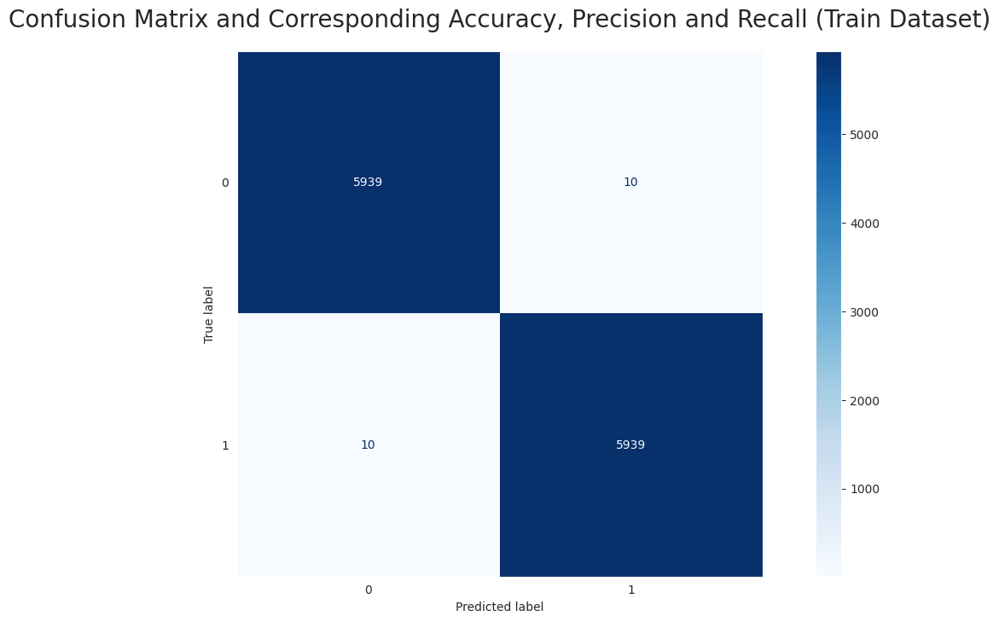

In [94]:
cfm = confusion_matrix(y_true=y_train, y_pred=best_model.predict(x_train))

TP = cfm[0][0]
FN = cfm[0][1]
FP = cfm[1][0]
TN = cfm[1][1]

# Create ConfusionMatrixDisplay object
disp = ConfusionMatrixDisplay(confusion_matrix=cfm, display_labels=best_model.classes_)

fig, ax = plt.subplots(figsize=(16, 8))
plt.title("Confusion Matrix and Corresponding Accuracy, Precision and Recall (Train Dataset)", size=20, pad=20)
# Plot the confusion matrix using the display object
disp.plot(cmap='Blues', ax=ax)
plt.grid(False)
plt.show()

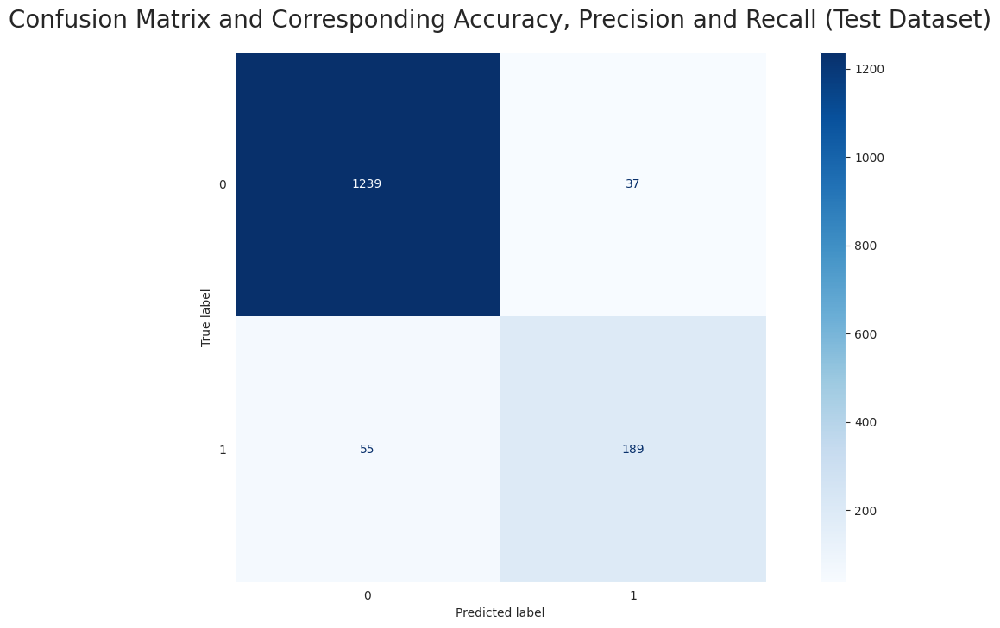

In [95]:
cfm = confusion_matrix(y_true=y_test, y_pred=best_model.predict(x_test))

TP = cfm[0][0]
FN = cfm[0][1]
FP = cfm[1][0]
TN = cfm[1][1]

# Create ConfusionMatrixDisplay object
disp = ConfusionMatrixDisplay(confusion_matrix=cfm, display_labels=best_model.classes_)

fig, ax = plt.subplots(figsize=(16, 8))
plt.title("Confusion Matrix and Corresponding Accuracy, Precision and Recall (Test Dataset)", size=20, pad=20)
# Plot the confusion matrix using the display object
disp.plot(cmap='Blues', ax=ax)
plt.grid(False)
plt.show()

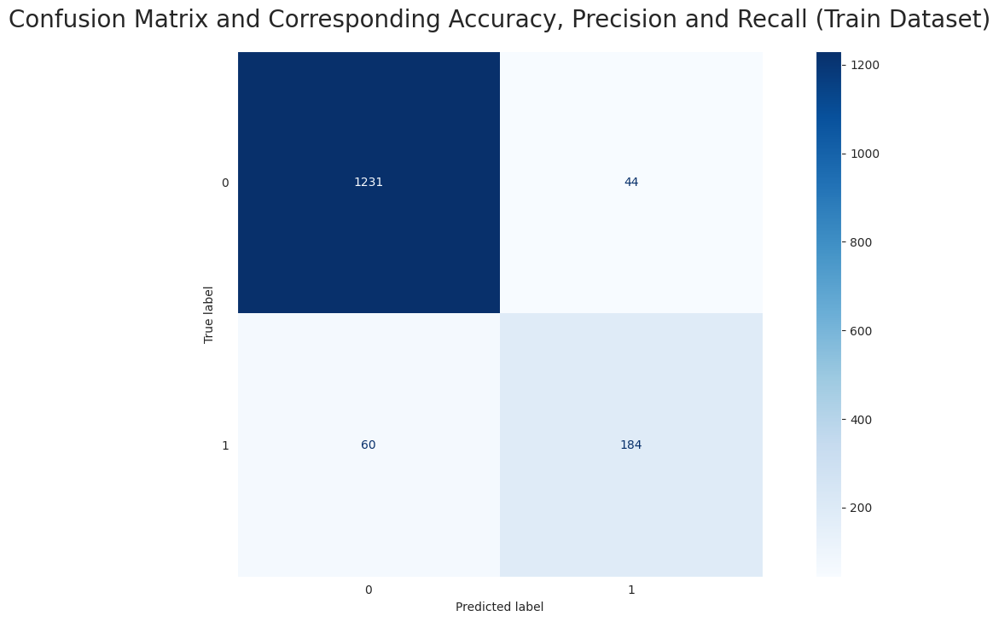

In [96]:
cfm = confusion_matrix(y_true=y_valid, y_pred=best_model.predict(x_valid))

TP = cfm[0][0]
FN = cfm[0][1]
FP = cfm[1][0]
TN = cfm[1][1]

# Create ConfusionMatrixDisplay object
disp = ConfusionMatrixDisplay(confusion_matrix=cfm, display_labels=best_model.classes_)

fig, ax = plt.subplots(figsize=(16, 8))
plt.title("Confusion Matrix and Corresponding Accuracy, Precision and Recall (Train Dataset)", size=20, pad=20)
# Plot the confusion matrix using the display object
disp.plot(cmap='Blues', ax=ax)
plt.grid(False)
plt.show()